# Niche definition using spatial neighbors  
### Spatial pancreas  

### Pre-requisites

In [1]:
import seaborn as sns
import pandas as pd
import numpy as np

import scanpy as sc
import squidpy as sq

import matplotlib.pyplot as plt

#sc.settings.set_figure_params(dpi=80, facecolor="white")

### Load data

In [2]:
folder = '/lustre/groups/ml01/workspace/sara.jimenez/spatial_pancreas_data/preprocessed_data/data4downstream/'
adata = sc.read(folder+'S1_ct_based_niche_label_npod_annotated.h5ad')
adata

/home/aih/sara.jimenez/miniconda3/envs/spatial/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 108711 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'niche_label'
    uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'design_matrix', 'neighbors', 'niche_label_colors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'spatial', 'spatial_fov'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [3]:
adata.obs['CellTypes_max'].cat.categories

Index(['Acinar_basal', 'Acinar_highEnz', 'Acinar_sigdiff', 'Acinar_signal',
       'Activated_Stellate', 'Alpha', 'Beta', 'Delta', 'Ductal', 'Endothelial',
       'MUC5b_Ductal', 'Macrophage', 'Quiescent_Stellate', 'Tcells'],
      dtype='object')

In [ ]:
adata.uns['cell_type_coarse_colors'] = [
    '#edd892', #acinar
    '#219ebc', #alpha
    '#adc178', #beta
    '#f79824', #ductal
    '#718355', #endocrine
    '#f15156', #endothelial
    '#bbd0ff', #Fibroblasts
    '#979dac', #Immune
    '#582f0e'  #mast
]

### Data Exploration

In [5]:
markers ={
    'Acinar_basal' : 'REG1A', 
    #'Acinar_highEnz': 'PRSS1', 
    'Acinar_signal': 'MT1X',
    'Acinar_sigdiff' : 'SOD2', 
    #'Ductal':'CFTR', 
    #'MUC5b_Ductal':'MUC5B',
    'Beta':'INS', 
    'Alpha':'GCG', 
    'Delta':'SST',
    'Activated_Stellate':'COL6A3', 
    'Quiescent_Stellate':'SPARCL1',    
    #'Endothelial':'PLVAP',    
    'Macrophage':'C1QB', 
    'Tcells':'CD2'
}

In [11]:
adata.obs.CellTypes_max.cat.categories

Index(['Acinar_basal', 'Acinar_highEnz', 'Acinar_sigdiff', 'Acinar_signal',
       'Activated_Stellate', 'Alpha', 'Beta', 'Delta', 'Ductal', 'Endothelial',
       'MUC5b_Ductal', 'Macrophage', 'Quiescent_Stellate', 'Tcells'],
      dtype='object')

In [34]:
markers = ['REG1A','SOD2','MT1X','COL6A3','GCG','INS','SST','C1QB',  'SPARCL1',  'CD2' ]

/home/aih/sara.jimenez/miniconda3/envs/spatial/lib/python3.9/site-packages/scanpy/plotting/_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


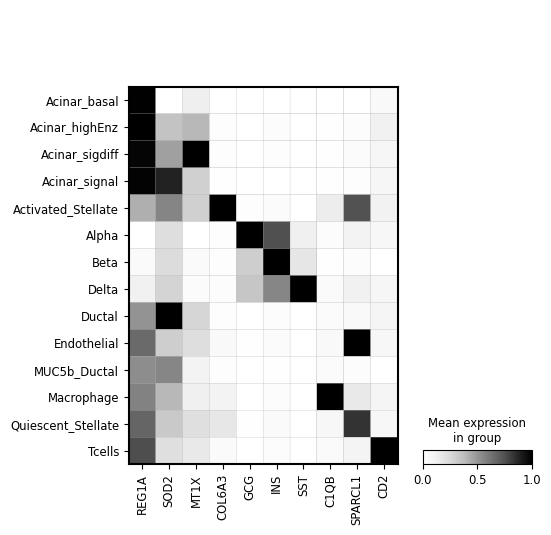

In [35]:
sc.pl.matrixplot(adata, markers, groupby='CellTypes_max', dendrogram=False,cmap='Greys',standard_scale='var')

In [38]:
adata.uns['niche_label_colors']  = ['#0A3D42',#N1
          '#FFED66',#N10
          '#1a767f',#N2
          '#73B2B9',#N3
          '#CBEEF3',#N4
          '#9D9D9C',#N5
          '#595CFF',#N6
          '#100BAC',#N7
          '#71C6CE',#N8
          '#A0EB0A',#N9    
         ]  

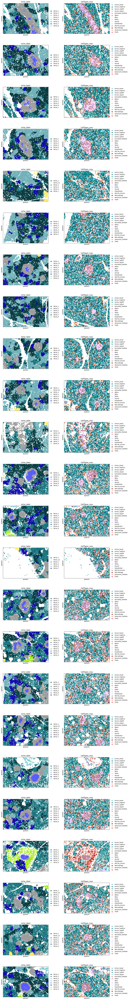

In [40]:
sq.pl.spatial_segment(adata,color=['niche_label','CellTypes_max'],ncols=2,#library_id=['12','10'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

### var by distance plot

In [42]:
sq.tl.var_by_distance(
    adata=adata,
    groups="Niche_5",
    cluster_key="niche_label",
    library_key="fov",
    covariates=['condition','CellTypes_max'],
)

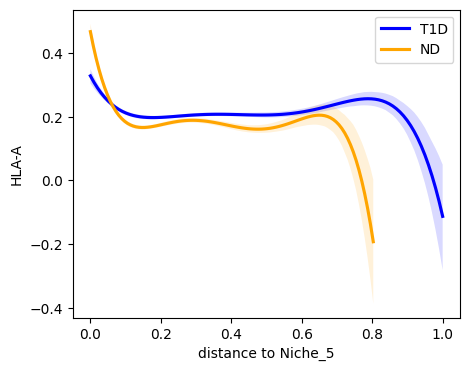

In [51]:
sq.pl.var_by_distance(
    adata=adata,
    design_matrix_key="design_matrix",
    var="HLA-A",
    anchor_key="Niche_5",
    covariate="condition",
    line_palette=["blue", "orange"],
    show_scatter=False,
    figsize=(5, 4),
)

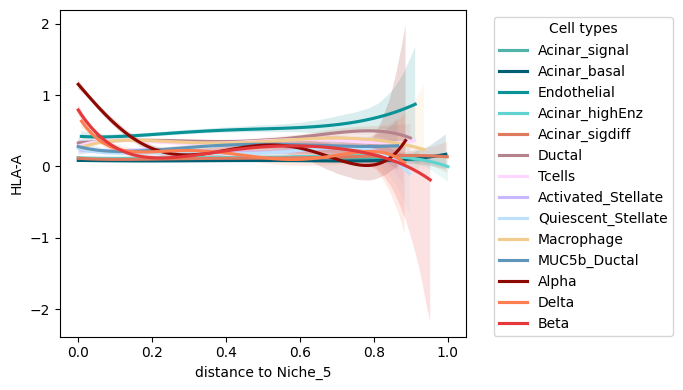

In [52]:
ax = sq.pl.var_by_distance(
    adata=adata,
    design_matrix_key="design_matrix",
    var="HLA-A",
    anchor_key="Niche_5",
    covariate="CellTypes_max",
    line_palette=['#4FB3AA','#005F73','#0A9396','#5FD3CF','#e07a5f','#b5838d','#ffd6ff','#c8b6ff','#bde0fe','#f2cc8f',
                  '#6096ba','#8d0801','#ff7f51','#e5383b'],
    show_scatter=False,
    figsize=(7, 4),return_ax =True
)
plt.legend(title='Cell types', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to make room for the legend
plt.tight_layout()

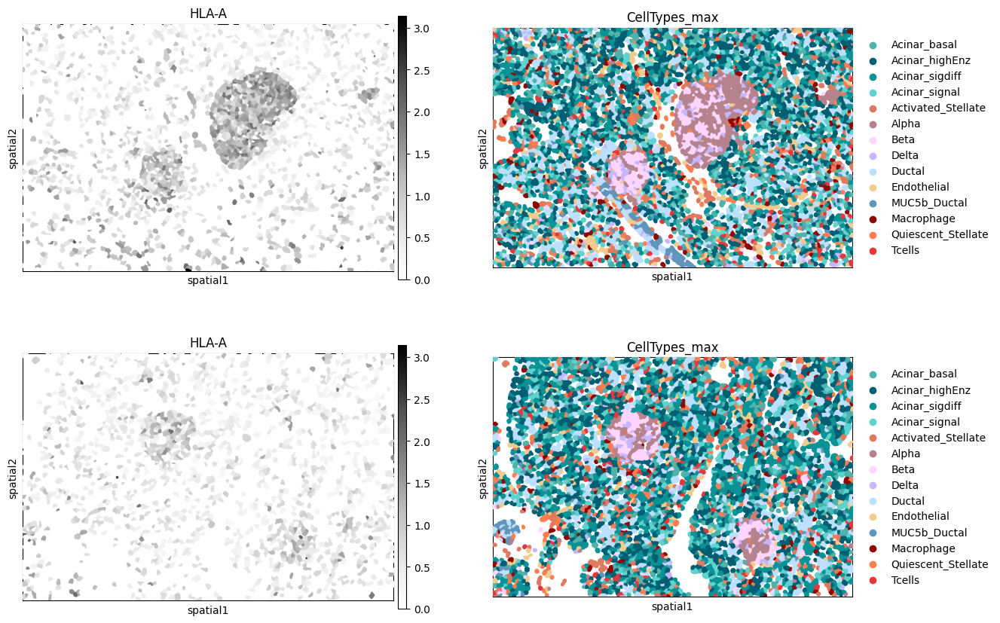

In [53]:
sq.pl.spatial_segment(adata,color=['HLA-A','CellTypes_max'],ncols=2,library_id=['12','10'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

In [54]:
adata

AnnData object with n_obs × n_vars = 108711 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'niche_label'
    uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'design_matrix', 'neighbors', 'niche_label_colors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'spatial', 'spatial_fov'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [62]:
adata_12 = adata[np.isin(adata.obs['fov'],['12'])].copy()
adata_12

AnnData object with n_obs × n_vars = 5208 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'niche_label'
    uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'design_matrix', 'neighbors', 'niche_label_colors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'spatial', 'spatial_fov'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [55]:
adata.obs.cell_type_coarse.cat.categories

Index(['Acinar', 'Alpha', 'Beta', 'Ductal', 'Endocrine', 'Endothelial',
       'Fibroblasts', 'Immune', 'Mast'],
      dtype='object')

In [110]:
sq.tl.var_by_distance(
    adata=adata_12,
    groups="Beta",
    cluster_key="cell_type_coarse",
    library_key="fov",
    covariates=['condition','cell_type_coarse'],
)

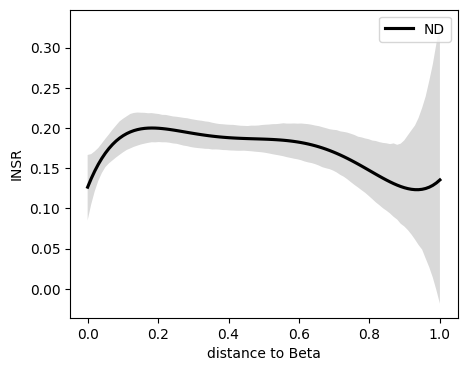

In [111]:
sq.pl.var_by_distance(
    adata=adata_12,
    design_matrix_key="design_matrix",
    var="INSR",
    anchor_key="Beta",
    covariate="condition",
    line_palette=["#000000", "#D9D9D9"],
    show_scatter=False,
    figsize=(5, 4),
)

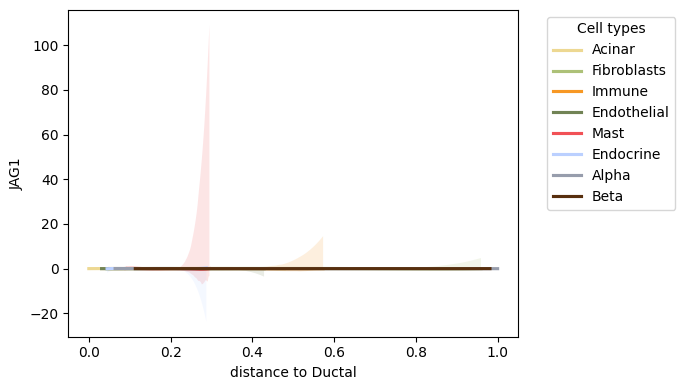

In [96]:
ax = sq.pl.var_by_distance(
    adata=adata_12,
    design_matrix_key="design_matrix",
    var="JAG1",
    anchor_key="Ductal",
    covariate="cell_type_coarse",
    line_palette=['#edd892','#219ebc','#adc178','#f79824','#718355','#f15156','#bbd0ff','#979dac','#582f0e'],
    show_scatter=False,
    figsize=(7, 4),return_ax =True
)
plt.legend(title='Cell types', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()

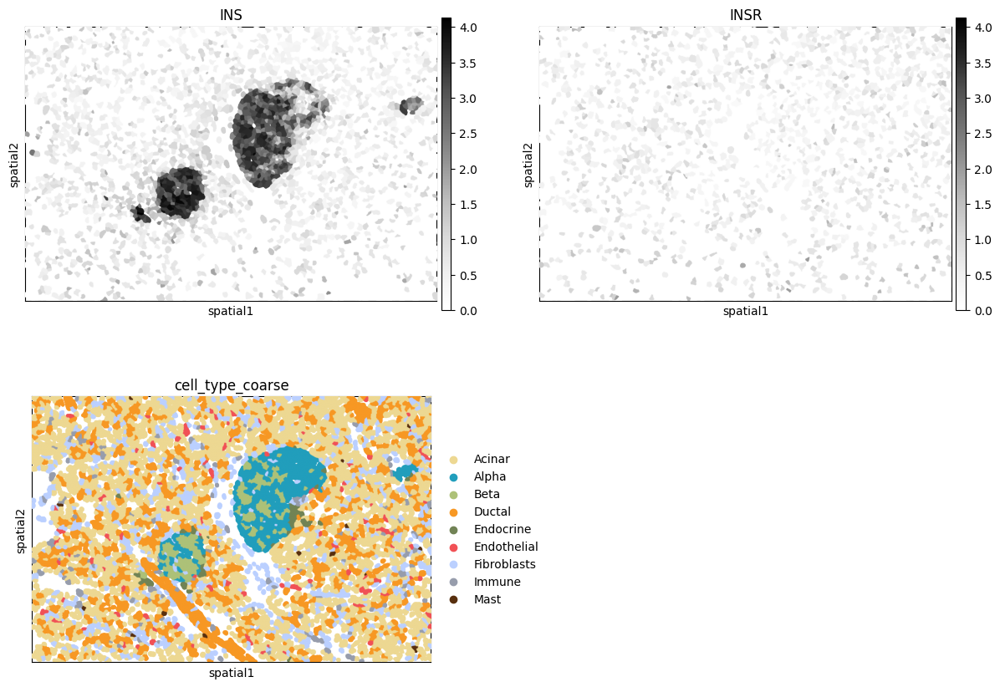

In [105]:
sq.pl.spatial_segment(adata,color=['INS','INSR','cell_type_coarse'],ncols=2,library_id=['12'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)